<a href="https://colab.research.google.com/github/Atharv-17/DIP_Mask_detetction/blob/main/DL_Project_5_face_Mask_Detection_using_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [49]:
!pip install kaggle

In [50]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


Importing Face Mask Dataset

In [51]:
# API to fetch the dataset from Kaggle
!kaggle datasets download -d omkargurav/face-mask-dataset

Dataset URL: https://www.kaggle.com/datasets/omkargurav/face-mask-dataset
License(s): unknown
face-mask-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [52]:
# extracting the compessed Dataset
from zipfile import ZipFile
dataset = '/content/face-mask-dataset.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [53]:
!ls

data		       images.jpeg  pexels-bess-hamiti-83687-35537.jpg
face-mask-dataset.zip  mmmmmm.jpg   sample_data


**Importing the Dependencies**

In [54]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split

In [55]:
with_mask_files = os.listdir('/content/data/with_mask')
print(with_mask_files[0:5])
print(with_mask_files[-5:])

['with_mask_2206.jpg', 'with_mask_2884.jpg', 'with_mask_3639.jpg', 'with_mask_1036.jpg', 'with_mask_573.jpg']
['with_mask_114.jpg', 'with_mask_2510.jpg', 'with_mask_2309.jpg', 'with_mask_2189.jpg', 'with_mask_120.jpg']


In [56]:
without_mask_files = os.listdir('/content/data/without_mask')
print(without_mask_files[0:5])
print(without_mask_files[-5:])

['without_mask_1345.jpg', 'without_mask_1163.jpg', 'without_mask_3767.jpg', 'without_mask_3283.jpg', 'without_mask_3389.jpg']
['without_mask_2538.jpg', 'without_mask_1264.jpg', 'without_mask_1328.jpg', 'without_mask_3007.jpg', 'without_mask_2238.jpg']


In [57]:
print('Number of with mask images:', len(with_mask_files))
print('Number of without mask images:', len(without_mask_files))

Number of with mask images: 3725
Number of without mask images: 3828


**Creating Labels for the two class of Images**

with mask  -->  1

without mask  -->  0

In [58]:
# create the labels

with_mask_labels = [1]*3725

without_mask_labels = [0]*3828

In [59]:
print(with_mask_labels[0:5])

print(without_mask_labels[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


In [60]:
print(len(with_mask_labels))
print(len(without_mask_labels))

3725
3828


In [61]:
labels = with_mask_labels + without_mask_labels

print(len(labels))
print(labels[0:5])
print(labels[-5:])

7553
[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


**Displaying the Images**

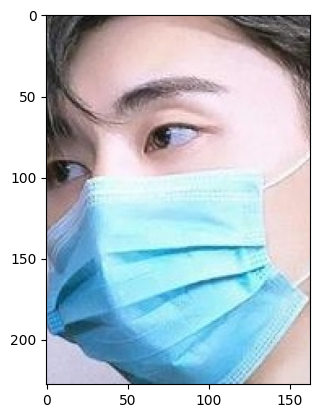

In [62]:
# displaying with mask image
img = mpimg.imread('/content/data/with_mask/with_mask_1545.jpg')
imgplot = plt.imshow(img)
plt.show()

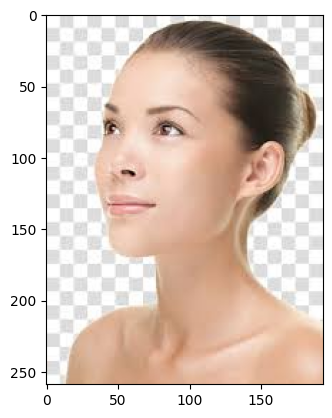

In [63]:
# displaying without mask image
img = mpimg.imread('/content/data/without_mask/without_mask_2925.jpg')
imgplot = plt.imshow(img)
plt.show()

**Image Processing**

1. Resize the Images

2. Convert the images to numpy arrays

In [64]:
# convert images to numpy arrays+

with_mask_path = '/content/data/with_mask/'

data = []

for img_file in with_mask_files:

  image = Image.open(with_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)



without_mask_path = '/content/data/without_mask/'


for img_file in without_mask_files:

  image = Image.open(without_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [65]:
type(data)

list

In [66]:
len(data)

7553

array([[[134, 124, 123],
        [134, 124, 123],
        [134, 124, 123],
        ...,
        [129, 119, 118],
        [129, 119, 118],
        [129, 119, 118]],

       [[134, 124, 123],
        [134, 124, 123],
        [134, 124, 123],
        ...,
        [130, 120, 119],
        [130, 120, 119],
        [130, 120, 119]],

       [[134, 124, 123],
        [134, 124, 123],
        [134, 124, 123],
        ...,
        [131, 121, 120],
        [131, 121, 120],
        [131, 121, 120]],

       ...,

       [[201, 186, 181],
        [193, 178, 173],
        [189, 174, 169],
        ...,
        [214, 212, 204],
        [213, 209, 207],
        [221, 208, 211]],

       [[201, 186, 181],
        [196, 181, 176],
        [181, 166, 161],
        ...,
        [212, 195, 190],
        [215, 202, 204],
        [221, 206, 209]],

       [[201, 186, 181],
        [196, 181, 176],
        [178, 163, 158],
        ...,
        [206, 171, 171],
        [216, 196, 198],
        [220, 205, 206]]], dtype=uint8)
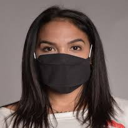

In [67]:
data[0]

In [68]:
type(data[0])

numpy.ndarray

In [69]:
data[0].shape

(128, 128, 3)

In [70]:
# converting image list and label list to numpy arrays

X = np.array(data)
Y = np.array(labels)

In [71]:
type(X)

numpy.ndarray

In [72]:
type(Y)

numpy.ndarray

In [73]:
print(X.shape)
print(Y.shape)

(7553, 128, 128, 3)
(7553,)


In [74]:
print(Y)

[1 1 1 ... 0 0 0]


**Train Test Split**

In [75]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [76]:
print(X.shape, X_train.shape, X_test.shape)

(7553, 128, 128, 3) (6042, 128, 128, 3) (1511, 128, 128, 3)


In [77]:
# scaling the data

X_train_scaled = X_train/255

X_test_scaled = X_test/255

array([[[ 19,   6,   0],
        [ 30,  16,   7],
        [ 52,  34,  24],
        ...,
        [ 25,  40,  42],
        [ 28,  42,  46],
        [ 30,  44,  47]],

       [[ 22,  10,   1],
        [ 35,  20,  11],
        [ 57,  39,  29],
        ...,
        [ 20,  35,  36],
        [ 20,  35,  36],
        [ 20,  34,  36]],

       [[ 30,  17,   8],
        [ 44,  28,  20],
        [ 67,  49,  41],
        ...,
        [ 24,  37,  37],
        [ 21,  34,  33],
        [ 19,  32,  32]],

       ...,

       [[147,  50,  57],
        [143,  45,  52],
        [139,  39,  46],
        ...,
        [205, 227, 238],
        [206, 228, 239],
        [207, 229, 240]],

       [[130,  53,  56],
        [128,  51,  54],
        [122,  45,  48],
        ...,
        [206, 228, 239],
        [207, 229, 239],
        [208, 229, 240]],

       [[110,  58,  54],
        [105,  53,  49],
        [ 94,  43,  38],
        ...,
        [209, 229, 240],
        [210, 230, 240],
        [210, 230, 239]]], dtype=uint8)
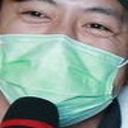

In [78]:
X_train[0]

In [79]:
X_train_scaled[0]

array([[[0.0745098 , 0.02352941, 0.        ],
        [0.11764706, 0.0627451 , 0.02745098],
        [0.20392157, 0.13333333, 0.09411765],
        ...,
        [0.09803922, 0.15686275, 0.16470588],
        [0.10980392, 0.16470588, 0.18039216],
        [0.11764706, 0.17254902, 0.18431373]],

       [[0.08627451, 0.03921569, 0.00392157],
        [0.1372549 , 0.07843137, 0.04313725],
        [0.22352941, 0.15294118, 0.11372549],
        ...,
        [0.07843137, 0.1372549 , 0.14117647],
        [0.07843137, 0.1372549 , 0.14117647],
        [0.07843137, 0.13333333, 0.14117647]],

       [[0.11764706, 0.06666667, 0.03137255],
        [0.17254902, 0.10980392, 0.07843137],
        [0.2627451 , 0.19215686, 0.16078431],
        ...,
        [0.09411765, 0.14509804, 0.14509804],
        [0.08235294, 0.13333333, 0.12941176],
        [0.0745098 , 0.1254902 , 0.1254902 ]],

       ...,

       [[0.57647059, 0.19607843, 0.22352941],
        [0.56078431, 0.17647059, 0.20392157],
        [0.54509804, 0

**Building a Convolutional Neural Networks (CNN)**

In [80]:
import tensorflow as tf
from tensorflow import keras

In [81]:
num_of_classes = 2

model = keras.Sequential()

model.add(keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dropout(0.5))


model.add(keras.layers.Dense(num_of_classes, activation='sigmoid'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [82]:
# compile the neural network
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['acc'])

In [83]:
# training the neural network
history = model.fit(X_train_scaled, Y_train, validation_split=0.1, epochs=5)

Epoch 1/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - acc: 0.7090 - loss: 0.7204 - val_acc: 0.8694 - val_loss: 0.3037
Epoch 2/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - acc: 0.8848 - loss: 0.2986 - val_acc: 0.8810 - val_loss: 0.2720
Epoch 3/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - acc: 0.9108 - loss: 0.2346 - val_acc: 0.9041 - val_loss: 0.2318
Epoch 4/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - acc: 0.9285 - loss: 0.2030 - val_acc: 0.9025 - val_loss: 0.2538
Epoch 5/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - acc: 0.9241 - loss: 0.1922 - val_acc: 0.9058 - val_loss: 0.2252


**Model Evaluation**

In [84]:
loss, accuracy = model.evaluate(X_test_scaled, Y_test)
print('Test Accuracy =', accuracy)

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - acc: 0.9128 - loss: 0.2547
Test Accuracy = 0.9166114926338196


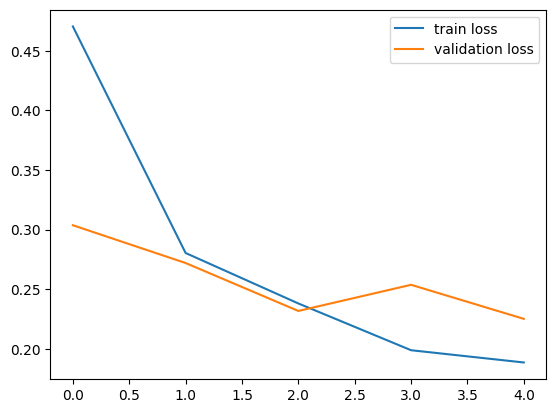

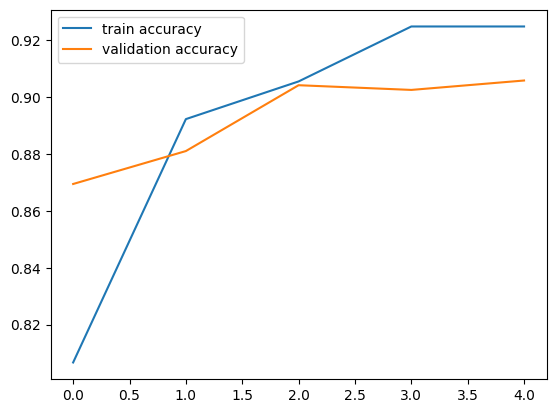

In [85]:
h = history

# plot the loss value
plt.plot(h.history['loss'], label='train loss')
plt.plot(h.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

# plot the accuracy value
plt.plot(h.history['acc'], label='train accuracy')
plt.plot(h.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()

**Predictive System**

Path of the image to be predicted: /content/mmmmmm.jpg


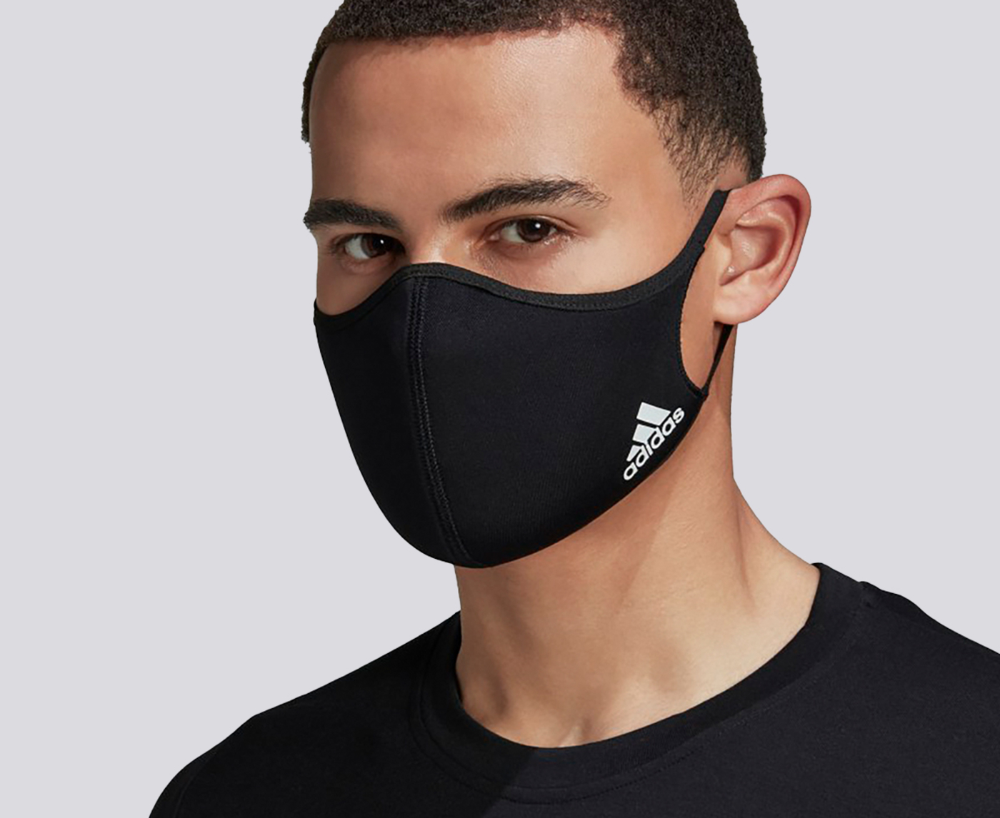

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
[[0.18660155 0.9000779 ]]
1
The person in the image is wearing a mask


In [86]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image, (128,128))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])

input_prediction = model.predict(input_image_reshaped)

print(input_prediction)


input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 1:

  print('The person in the image is wearing a mask')

else:

  print('The person in the image is not wearing a mask')

Path of the image to be predicted: /content/pexels-bess-hamiti-83687-35537.jpg


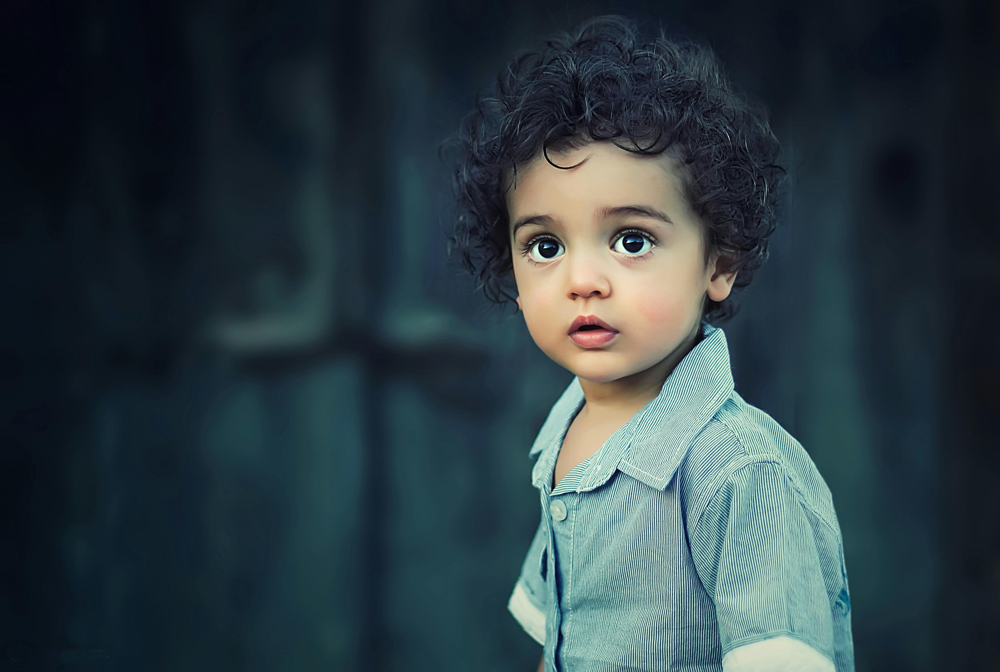

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
[[0.5243376  0.50251484]]
0
The person in the image is not wearing a mask


In [90]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image, (128,128))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])

input_prediction = model.predict(input_image_reshaped)

print(input_prediction)


input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 1:

  print('The person in the image is wearing a mask')

else:

  print('The person in the image is not wearing a mask')